# MobileNet

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.datasets import Imagenette
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.gridspec as gs
import numpy as np
import os
import re

In [2]:
os.makedirs("models", exist_ok=True)
device = "cuda" if torch.cuda.is_available() else "cpu"
BATCH_SIZE = 256
IMAGE_SIZE = 256
NUM_EPOCHS = 30

In [3]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])

ds = Imagenette(root=".", split="train", download=False, transform=transform)
loader = DataLoader(ds, batch_size=64, shuffle=False, num_workers=4)

mean = 0.
std = 0.
n = 0
for imgs, _ in loader:
    B, C, H, W = imgs.shape
    imgs = imgs.view(B, C, -1)
    mean += imgs.mean(2).sum(0)
    std += imgs.std(2).sum(0)
    n += B

mean /= n
std /= n

In [4]:
normalize = transforms.Normalize(mean, std)


transform_train = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomResizedCrop(224, scale=(0.5, 1.0), ratio=(0.75, 1.33)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.05, contrast=0.05, saturation=0.05),
    transforms.ToTensor(),
    normalize,
])

transform_val = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    normalize,
])


train_dataset = Imagenette(root=".", split='train', download=False, transform=transform_train)
test_dataset = Imagenette(root=".", split='val', download=False, transform=transform_val)


NUM_WORKERS = 8
PREFETCH    = 4

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    prefetch_factor=PREFETCH,
    pin_memory=(device == "cuda"),
    drop_last=True,
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    prefetch_factor=PREFETCH,
    pin_memory=(device == "cuda"),
    drop_last=False,
)

In [5]:
class MobileNet(nn.Module):
    def __init__(self, num_classes: int = 10):
        super().__init__()
        
        # Initial standard convolution: 3x3x3x32, stride 2
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=2, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(32)
        self.relu1 = nn.ReLU()
        
        # Depthwise separable conv block 1: 32 -> 64, stride 1
        self.conv2 = nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1, groups=32, bias=False)
        self.bn2 = nn.BatchNorm2d(32)
        self.relu2 = nn.ReLU()
        self.conv3 = nn.Conv2d(32, 64, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn3 = nn.BatchNorm2d(64)
        self.relu3 = nn.ReLU()
        
        # Depthwise separable conv block 2: 64 -> 128, stride 2
        self.conv4 = nn.Conv2d(64, 64, kernel_size=3, stride=2, padding=1, groups=64, bias=False)
        self.bn4 = nn.BatchNorm2d(64)
        self.relu4 = nn.ReLU()
        self.conv5 = nn.Conv2d(64, 128, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn5 = nn.BatchNorm2d(128)
        self.relu5 = nn.ReLU()
        
        # Depthwise separable conv block 3: 128 -> 128, stride 1
        self.conv6 = nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1, groups=128, bias=False)
        self.bn6 = nn.BatchNorm2d(128)
        self.relu6 = nn.ReLU()
        self.conv7 = nn.Conv2d(128, 128, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn7 = nn.BatchNorm2d(128)
        self.relu7 = nn.ReLU()
        
        # Depthwise separable conv block 4: 128 -> 256, stride 2
        self.conv8 = nn.Conv2d(128, 128, kernel_size=3, stride=2, padding=1, groups=128, bias=False)
        self.bn8 = nn.BatchNorm2d(128)
        self.relu8 = nn.ReLU()
        self.conv9 = nn.Conv2d(128, 256, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn9 = nn.BatchNorm2d(256)
        self.relu9 = nn.ReLU()
        
        # Depthwise separable conv block 5: 256 -> 256, stride 1
        self.conv10 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1, groups=256, bias=False)
        self.bn10 = nn.BatchNorm2d(256)
        self.relu10 = nn.ReLU()
        self.conv11 = nn.Conv2d(256, 256, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn11 = nn.BatchNorm2d(256)
        self.relu11 = nn.ReLU()
        
        # Depthwise separable conv block 6: 256 -> 512, stride 2
        self.conv12 = nn.Conv2d(256, 256, kernel_size=3, stride=2, padding=1, groups=256, bias=False)
        self.bn12 = nn.BatchNorm2d(256)
        self.relu12 = nn.ReLU()
        self.conv13 = nn.Conv2d(256, 512, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn13 = nn.BatchNorm2d(512)
        self.relu13 = nn.ReLU()
        
        # 5x Depthwise separable conv blocks: 512 -> 512, stride 1
        self.conv14 = nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, groups=512, bias=False)
        self.bn14 = nn.BatchNorm2d(512)
        self.relu14 = nn.ReLU()
        self.conv15 = nn.Conv2d(512, 512, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn15 = nn.BatchNorm2d(512)
        self.relu15 = nn.ReLU()
        
        self.conv16 = nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, groups=512, bias=False)
        self.bn16 = nn.BatchNorm2d(512)
        self.relu16 = nn.ReLU()
        self.conv17 = nn.Conv2d(512, 512, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn17 = nn.BatchNorm2d(512)
        self.relu17 = nn.ReLU()
        
        self.conv18 = nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, groups=512, bias=False)
        self.bn18 = nn.BatchNorm2d(512)
        self.relu18 = nn.ReLU()
        self.conv19 = nn.Conv2d(512, 512, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn19 = nn.BatchNorm2d(512)
        self.relu19 = nn.ReLU()
        
        self.conv20 = nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, groups=512, bias=False)
        self.bn20 = nn.BatchNorm2d(512)
        self.relu20 = nn.ReLU()
        self.conv21 = nn.Conv2d(512, 512, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn21 = nn.BatchNorm2d(512)
        self.relu21 = nn.ReLU()
        
        self.conv22 = nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, groups=512, bias=False)
        self.bn22 = nn.BatchNorm2d(512)
        self.relu22 = nn.ReLU()
        self.conv23 = nn.Conv2d(512, 512, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn23 = nn.BatchNorm2d(512)
        self.relu23 = nn.ReLU()
        
        # Depthwise separable conv block 12: 512 -> 1024, stride 2
        self.conv24 = nn.Conv2d(512, 512, kernel_size=3, stride=2, padding=1, groups=512, bias=False)
        self.bn24 = nn.BatchNorm2d(512)
        self.relu24 = nn.ReLU()
        self.conv25 = nn.Conv2d(512, 1024, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn25 = nn.BatchNorm2d(1024)
        self.relu25 = nn.ReLU()
        
        # Depthwise separable conv block 13: 1024 -> 1024, stride 1
        self.conv26 = nn.Conv2d(1024, 1024, kernel_size=3, stride=1, padding=1, groups=1024, bias=False)
        self.bn26 = nn.BatchNorm2d(1024)
        self.relu26 = nn.ReLU()
        self.conv27 = nn.Conv2d(1024, 1024, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn27 = nn.BatchNorm2d(1024)
        self.relu27 = nn.ReLU()
        
        # Average pooling and fully connected layer
        self.avgpool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Linear(1024, num_classes)
    
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # Initial standard convolution
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu1(x)
        
        # Depthwise separable conv block 1
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu2(x)
        x = self.conv3(x)
        x = self.bn3(x)
        x = self.relu3(x)
        
        # Depthwise separable conv block 2
        x = self.conv4(x)
        x = self.bn4(x)
        x = self.relu4(x)
        x = self.conv5(x)
        x = self.bn5(x)
        x = self.relu5(x)
        
        # Depthwise separable conv block 3
        x = self.conv6(x)
        x = self.bn6(x)
        x = self.relu6(x)
        x = self.conv7(x)
        x = self.bn7(x)
        x = self.relu7(x)
        
        # Depthwise separable conv block 4
        x = self.conv8(x)
        x = self.bn8(x)
        x = self.relu8(x)
        x = self.conv9(x)
        x = self.bn9(x)
        x = self.relu9(x)
        
        # Depthwise separable conv block 5
        x = self.conv10(x)
        x = self.bn10(x)
        x = self.relu10(x)
        x = self.conv11(x)
        x = self.bn11(x)
        x = self.relu11(x)
        
        # Depthwise separable conv block 6
        x = self.conv12(x)
        x = self.bn12(x)
        x = self.relu12(x)
        x = self.conv13(x)
        x = self.bn13(x)
        x = self.relu13(x)
        
        # 5x Depthwise separable conv blocks (512 -> 512)
        x = self.conv14(x)
        x = self.bn14(x)
        x = self.relu14(x)
        x = self.conv15(x)
        x = self.bn15(x)
        x = self.relu15(x)
        
        x = self.conv16(x)
        x = self.bn16(x)
        x = self.relu16(x)
        x = self.conv17(x)
        x = self.bn17(x)
        x = self.relu17(x)
        
        x = self.conv18(x)
        x = self.bn18(x)
        x = self.relu18(x)
        x = self.conv19(x)
        x = self.bn19(x)
        x = self.relu19(x)
        
        x = self.conv20(x)
        x = self.bn20(x)
        x = self.relu20(x)
        x = self.conv21(x)
        x = self.bn21(x)
        x = self.relu21(x)
        
        x = self.conv22(x)
        x = self.bn22(x)
        x = self.relu22(x)
        x = self.conv23(x)
        x = self.bn23(x)
        x = self.relu23(x)
        
        # Depthwise separable conv block 12
        x = self.conv24(x)
        x = self.bn24(x)
        x = self.relu24(x)
        x = self.conv25(x)
        x = self.bn25(x)
        x = self.relu25(x)
        
        # Depthwise separable conv block 13
        x = self.conv26(x)
        x = self.bn26(x)
        x = self.relu26(x)
        x = self.conv27(x)
        x = self.bn27(x)
        x = self.relu27(x)
        
        # Average pooling and fully connected
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)
        
        return x

In [6]:
def evaluate(model: nn.Module, loader: DataLoader, device: str, loss_fn: nn.Module) -> tuple[float, float, float]:
    model.eval()
    total_loss = 0.0
    total = 0
    top1_correct = 0
    top5_correct = 0

    with torch.no_grad():
        val_bar = tqdm(loader, desc="[Eval]", leave=False)
        for imgs, labels in val_bar:
            imgs = imgs.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            outputs = model(imgs)
            loss = loss_fn(outputs, labels)
            total_loss += loss.item()

            maxk = min(5, outputs.size(1))
            _, pred = outputs.topk(maxk, dim=1, largest=True, sorted=True)
            pred = pred.t()
            correct = pred.eq(labels.view(1, -1).expand_as(pred))

            top1_correct += correct[:1].sum().item()
            top5_correct += correct[:maxk].sum().item()
            total += labels.size(0)

    avg_loss = total_loss / len(loader)
    top1_acc = 100.0 * top1_correct / total
    top5_acc = 100.0 * top5_correct / total
    return avg_loss, top1_acc, top5_acc

In [7]:
model = MobileNet()
model.to(device)

depthwise_params = []
other_params = []

for name, param in model.named_parameters():
    if 'conv' in name and param.requires_grad:
        # Check if it's a depthwise conv by looking at the layer
        layer_num = int(name.split('.')[0].replace('conv', ''))
        
        if layer_num >= 2 and layer_num % 2 == 0 and 'weight' in name:
            depthwise_params.append(param)
        else:
            other_params.append(param)
    else:
        other_params.append(param)

optimizer = torch.optim.RMSprop([
    {'params': depthwise_params, 'weight_decay': 0.0},
    {'params': other_params, 'weight_decay': 4e-5}
], lr=0.045, momentum=0.9, eps=1.0)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.94)

loss_fn = nn.CrossEntropyLoss()

# optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=5e-4)
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
#     optimizer, mode="max", factor=0.1, patience=2,
# )
# loss_fn = nn.CrossEntropyLoss()

In [8]:
for epoch in range(NUM_EPOCHS):
    model.train()
    train_loss = 0.0

    train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} [Train]", leave=False)
    for imgs, labels in train_bar:
        imgs = imgs.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)
        outputs = model(imgs)
        loss = loss_fn(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        train_bar.set_postfix({'loss': loss.item()})

    avg_train_loss = train_loss / len(train_loader)
    
    avg_val_loss, top1_acc, top5_acc = evaluate(model, test_loader, device, loss_fn)

    scheduler.step()
    current_lr = optimizer.param_groups[0]['lr']

    print(f"Epoch {epoch+1} - LR: {current_lr:.6f} | Train loss: {avg_train_loss:.4f} | "
          f"Val loss: {avg_val_loss:.4f} | Top-1 val acc: {top1_acc:.2f}% | Top-5 val acc: {top5_acc:.2f}%")

    if (epoch + 1) % 10 == 0:
        torch.save({
            "epoch": epoch,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "train_loss": avg_train_loss,
            "val_loss": avg_val_loss,
            "top1_val_acc": top1_acc,
            "top5_val_acc": top5_acc,
        }, os.path.join("models", "mobilenet_imagenette_checkpoint.pth"))


Epoch 1 - LR: 0.045000 | Train loss: 2.1281 | Val loss: 3.2765 | Top-1 val acc: 12.92% | Top-5 val acc: 55.21%


Epoch 2 - LR: 0.042300 | Train loss: 1.7436 | Val loss: 3.7009 | Top-1 val acc: 32.33% | Top-5 val acc: 65.04%


Epoch 3 - LR: 0.042300 | Train loss: 1.4309 | Val loss: 1.6049 | Top-1 val acc: 48.87% | Top-5 val acc: 89.94%


Epoch 4 - LR: 0.039762 | Train loss: 1.2778 | Val loss: 1.3957 | Top-1 val acc: 55.21% | Top-5 val acc: 92.08%


Epoch 5 - LR: 0.039762 | Train loss: 1.1361 | Val loss: 1.8014 | Top-1 val acc: 53.25% | Top-5 val acc: 90.34%


Epoch 6 - LR: 0.037376 | Train loss: 1.0509 | Val loss: 1.2485 | Top-1 val acc: 62.68% | Top-5 val acc: 93.04%


Epoch 7 - LR: 0.037376 | Train loss: 0.9810 | Val loss: 1.0944 | Top-1 val acc: 63.87% | Top-5 val acc: 93.89%


Epoch 8 - LR: 0.035134 | Train loss: 0.8714 | Val loss: 1.1337 | Top-1 val acc: 66.24% | Top-5 val acc: 95.54%


Epoch 9 - LR: 0.035134 | Train loss: 0.7831 | Val loss: 1.0751 | Top-1 val acc: 66.45% | Top-5 val acc: 95.11%


Epoch 10 - LR: 0.033026 | Train loss: 0.7775 | Val loss: 0.9289 | Top-1 val acc: 70.83% | Top-5 val acc: 96.10%


Epoch 11 - LR: 0.033026 | Train loss: 0.6999 | Val loss: 0.7631 | Top-1 val acc: 75.67% | Top-5 val acc: 97.07%


Epoch 12 - LR: 0.031044 | Train loss: 0.6513 | Val loss: 0.8221 | Top-1 val acc: 73.89% | Top-5 val acc: 96.89%


Epoch 13 - LR: 0.031044 | Train loss: 0.6300 | Val loss: 0.7720 | Top-1 val acc: 75.34% | Top-5 val acc: 97.27%


Epoch 14 - LR: 0.029181 | Train loss: 0.5862 | Val loss: 0.7022 | Top-1 val acc: 77.73% | Top-5 val acc: 97.12%


Epoch 15 - LR: 0.029181 | Train loss: 0.5327 | Val loss: 0.9721 | Top-1 val acc: 73.15% | Top-5 val acc: 97.27%


Epoch 16 - LR: 0.027431 | Train loss: 0.5275 | Val loss: 0.7752 | Top-1 val acc: 76.33% | Top-5 val acc: 97.17%


Epoch 17 - LR: 0.027431 | Train loss: 0.5044 | Val loss: 0.6697 | Top-1 val acc: 78.85% | Top-5 val acc: 97.78%


Epoch 18 - LR: 0.025785 | Train loss: 0.4812 | Val loss: 0.7028 | Top-1 val acc: 78.29% | Top-5 val acc: 97.63%


Epoch 19 - LR: 0.025785 | Train loss: 0.4443 | Val loss: 0.6571 | Top-1 val acc: 79.80% | Top-5 val acc: 97.68%


Epoch 20 - LR: 0.024238 | Train loss: 0.4363 | Val loss: 0.7165 | Top-1 val acc: 79.36% | Top-5 val acc: 97.61%


Epoch 21 - LR: 0.024238 | Train loss: 0.4111 | Val loss: 0.6418 | Top-1 val acc: 79.72% | Top-5 val acc: 98.11%


Epoch 22 - LR: 0.022783 | Train loss: 0.3999 | Val loss: 0.7147 | Top-1 val acc: 78.68% | Top-5 val acc: 97.66%


Epoch 23 - LR: 0.022783 | Train loss: 0.3632 | Val loss: 0.6582 | Top-1 val acc: 80.05% | Top-5 val acc: 98.09%


Epoch 24 - LR: 0.021416 | Train loss: 0.3449 | Val loss: 0.6479 | Top-1 val acc: 80.43% | Top-5 val acc: 97.99%


Epoch 25 - LR: 0.021416 | Train loss: 0.3367 | Val loss: 0.6614 | Top-1 val acc: 80.25% | Top-5 val acc: 97.73%


Epoch 26 - LR: 0.020131 | Train loss: 0.3145 | Val loss: 0.6422 | Top-1 val acc: 80.64% | Top-5 val acc: 97.89%


Epoch 27 - LR: 0.020131 | Train loss: 0.2900 | Val loss: 0.6661 | Top-1 val acc: 80.79% | Top-5 val acc: 98.17%


Epoch 28 - LR: 0.018924 | Train loss: 0.2738 | Val loss: 0.7138 | Top-1 val acc: 79.82% | Top-5 val acc: 97.78%


Epoch 29 - LR: 0.018924 | Train loss: 0.2688 | Val loss: 0.6756 | Top-1 val acc: 80.99% | Top-5 val acc: 98.17%


Epoch 30 - LR: 0.017788 | Train loss: 0.2530 | Val loss: 0.6346 | Top-1 val acc: 81.81% | Top-5 val acc: 97.99%


# Visualising MobileNet

In [6]:
checkpoint = torch.load("models/mobilenet_imagenette_checkpoint.pth", map_location="cpu")
model = MobileNet().to(device)
model.load_state_dict(checkpoint["model_state_dict"], strict=False)
model.eval()

MobileNet(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu1): ReLU()
  (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
  (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu2): ReLU()
  (conv3): Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu3): ReLU()
  (conv4): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=64, bias=False)
  (bn4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu4): ReLU()
  (conv5): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu5): ReLU()
  (conv6): Conv2d(

In [7]:
def _as_3x1x1(v):
    if v is None: 
        return None
    v = torch.tensor(v) if not isinstance(v, torch.Tensor) else v
    return v.float().view(3,1,1)


class GuidedBackprop:
    def __init__(self, model: nn.Module):
        self.model = model
        self._handles = []
        
        def fwd_relu(m: nn.Module, inp: tuple[torch.Tensor, ...], out: torch.Tensor) -> None: 
            m._gbp_out = out

        def bwd_relu(m: nn.Module, gin: tuple[torch.Tensor, ...], gout: tuple[torch.Tensor, ...]) -> tuple[torch.Tensor,]:
            mask = (m._gbp_out > 0).type_as(gout[0])
            return (torch.clamp(gout[0], min=0.0) * mask, )

        for m in self.model.modules():
            if isinstance(m, nn.ReLU):
                self._handles.append(m.register_forward_hook(fwd_relu))
                self._handles.append(m.register_full_backward_hook(bwd_relu))

    def close(self) -> None:
        for h in self._handles: 
            h.remove()
        self._handles.clear()


def compute_rf(model: nn.Module, in_hw: tuple[int, int] = (224, 224),
               layers: tuple[str, ...] = None) -> dict[str, tuple[int, int, float]]:
    """
    Return per-layer (rf_size, jump, start) in input pixel coords.
    start is the center (in pixel coords) of the [0,0] activation.
    """
    r, j, s = 1.0, 1.0, 0.5
    table = {}
    
    for name in layers:
        m = getattr(model, name)
        if isinstance(m, nn.Conv2d):
            k = float(m.kernel_size[0] if isinstance(m.kernel_size, tuple) else m.kernel_size)
            p = float(m.padding[0] if isinstance(m.padding, tuple) else m.padding)
            st = float(m.stride[0] if isinstance(m.stride, tuple) else m.stride)
            r = r + (k - 1.0) * j
            s = s + ((k - 1.0) / 2.0 - p) * j
            j = j * st
        elif isinstance(m, nn.MaxPool2d):
            k = float(m.kernel_size if isinstance(m.kernel_size, int) else m.kernel_size[0])
            p = float(m.padding if isinstance(m.padding, int) else m.padding[0])
            st = float(m.stride if isinstance(m.stride, int) else m.stride[0])
            r = r + (k - 1.0) * j
            s = s + ((k - 1.0) / 2.0 - p) * j
            j = j * st
        
        table[name] = (int(round(r)), int(round(j)), float(s))

    return table

In [ ]:

class Visualiser:
    """
    Guided ReLU visualisation with top-k activations per feature map,
    receptive-field matched patches for MobileNet.
    """

    TAP = {
        "conv1": "relu1",
        "conv2": "relu2", "conv3": "relu3",
        "conv4": "relu4", "conv5": "relu5",
        "conv6": "relu6", "conv7": "relu7",
        "conv8": "relu8", "conv9": "relu9",
        "conv10": "relu10", "conv11": "relu11",
        "conv12": "relu12", "conv13": "relu13",
        "conv14": "relu14", "conv15": "relu15",
        "conv16": "relu16", "conv17": "relu17",
        "conv18": "relu18", "conv19": "relu19",
        "conv20": "relu20", "conv21": "relu21",
        "conv22": "relu22", "conv23": "relu23",
        "conv24": "relu24", "conv25": "relu25",
        "conv26": "relu26", "conv27": "relu27",
    }

    _RF_ORDER = [
        "conv1",
        "conv2", "conv3",
        "conv4", "conv5",
        "conv6", "conv7",
        "conv8", "conv9",
        "conv10", "conv11",
        "conv12", "conv13",
        "conv14", "conv15",
        "conv16", "conv17",
        "conv18", "conv19",
        "conv20", "conv21",
        "conv22", "conv23",
        "conv24", "conv25",
        "conv26", "conv27",
    ]

    def __init__(self, model: nn.Module, device: str = "cuda", mean: float = None, std: float = None):
        self.m = model.eval().to(device)
        self.device = device
        self.mean = _as_3x1x1(mean)
        self.std = _as_3x1x1(std)
        self.handles = []
        self.acts = {}
        self._keep_graph = False

        for name in self._RF_ORDER:
            self._register_activation(name)

        self.rf_tbl = compute_rf(self.m, in_hw=(224, 224), layers=self._RF_ORDER)

    def _register_activation(self, name: str) -> None:
        tap_name = self.TAP[name]
        mod = getattr(self.m, tap_name)
        def hook(_, __, out):
            self.acts[name] = out if self._keep_graph else out.detach()
        self.handles.append(mod.register_forward_hook(hook))

    @torch.no_grad()
    def _rank_channels_by_activity(self, loader: DataLoader, layer: str) -> list[int]:
        totals = None
        for imgs, _ in loader:
            imgs = imgs.to(self.device, non_blocking=True)
            _ = self._forward(imgs)
            A = self.acts[layer]
            m = A.mean(dim=(0,2,3))
            totals = m if totals is None else totals + m
        return torch.argsort(totals, descending=True).tolist()

    def close(self) -> None:
        for h in self.handles: 
            h.remove()
        self.handles.clear()

    @torch.no_grad()
    def _forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.m(x)

    def _forward_with_grad(self, x: torch.Tensor) -> torch.Tensor:
        self._keep_graph = True
        out = self.m(x)
        self._keep_graph = False
        return out

    def _guided_from_unit(self, layer: str, fmap: int, y: int, x: int, img1x: torch.Tensor) -> torch.Tensor:
        gbp = GuidedBackprop(self.m)
        _ = self._forward_with_grad(img1x)
        scalar = self.acts[layer][0, fmap, y, x]
        self.m.zero_grad(set_to_none=True)
        scalar.backward(retain_graph=False)
        grad = img1x.grad.detach()[0]
        gbp.close()
        g = grad - grad.min()
        g = (g / (g.max() + 1e-8)).clamp(0,1)
        return g

    @staticmethod
    def _rf_box(rf: int, jump: int, start: float, y: int, x: int) -> tuple[int, int, int, int]:
        cy = int(round(start + y * jump))
        cx = int(round(start + x * jump))
        half = rf // 2
        y0, y1 = cy - half, cy + half + 1
        x0, x1 = cx - half, cx + half + 1
        return y0, y1, x0, x1

    @staticmethod
    def _rf_fully_inside(H: int, W: int, rf: int, jump: int, start: float, y: int, x: int) -> bool:
        y0, y1, x0, x1 = Visualiser._rf_box(rf, jump, start, y, x)
        return (y0 >= 0) and (x0 >= 0) and (y1 <= H) and (x1 <= W)

    @torch.inference_mode()
    def topk_for_featuremap(self, loader: DataLoader, layer: str, fmap: int, k: int = 9,
                            inside_only: bool = False, oversample_factor: int = 5):
        top = []
        rf, jump, start = self.rf_tbl[layer]
        for imgs, labels in loader:
            imgs = imgs.to(self.device, non_blocking=True)
            _ = self._forward(imgs)
            A = self.acts[layer]
            Hf, Wf = A.shape[-2:]
            Himg, Wimg = imgs.shape[-2:]
            n_cand = min(Hf * Wf, max(k, 1) * max(oversample_factor, 1))
            vals, idxs = A[:, fmap].view(imgs.size(0), -1).topk(n_cand, dim=1)
            for b in range(imgs.size(0)):
                for j in range(vals.shape[1]):
                    score = float(vals[b, j])
                    if score <= 0: 
                        continue
                    flat = int(idxs[b, j])
                    y, x = divmod(flat, Wf)
                    if inside_only and not self._rf_fully_inside(Himg, Wimg, rf, jump, start, y, x):
                        continue
                    top.append((score, (imgs[b].detach().cpu(), int(labels[b]), len(top)), (y, x)))
                    
        top = sorted(top, key=lambda t: t[0], reverse=True)[:k]
        return top

    @staticmethod
    def _crop_patch(img3hw: torch.Tensor, center_yx: tuple[int,int], rf_size: int, jump: int, start: float) -> torch.Tensor:
        H, W = img3hw.shape[-2], img3hw.shape[-1]
        y, x = center_yx
        cy = int(round(start + y * jump))
        cx = int(round(start + x * jump))
        half = rf_size // 2
        y0_des, y1_des = cy - half, cy + half + 1
        x0_des, x1_des = cx - half, cx + half + 1
        y0, y1 = max(0, y0_des), min(H, y1_des)
        x0, x1 = max(0, x0_des), min(W, x1_des)
        patch = img3hw[:, y0:y1, x0:x1]
        pad_top = max(0, -y0_des)
        pad_bottom = max(0, y1_des - H)
        pad_left = max(0, -x0_des)
        pad_right = max(0, x1_des - W)
        if pad_left or pad_right or pad_top or pad_bottom:
            patch = F.pad(patch, (pad_left, pad_right, pad_top, pad_bottom))
        if patch.shape[-2:] != (rf_size, rf_size):
            patch = F.pad(
                patch,
                (0, max(0, rf_size - patch.shape[-1]),
                 0, max(0, rf_size - patch.shape[-2]))
            )[:, :rf_size, :rf_size]
        return patch

    def _denorm(self, patch: torch.Tensor) -> torch.Tensor:
        """Invert transforms.Normalize for display only."""
        if (self.mean is not None) and (self.std is not None):
            return (patch * self.std + self.mean).clamp(0, 1)
        return patch.clamp(0,1)

    def figure2_panel(
        self, 
        loader: DataLoader, 
        layers: tuple[str, ...] = ("conv2", "conv4", "conv6", "conv8", "conv10", "conv12", "conv14", "conv18"),
        k_per_map: int = 9, 
        n_maps: int = 4, 
        seed: int = 0
    ) -> dict[str, list[tuple[torch.Tensor, torch.Tensor]]]:

        if isinstance(layers, str):
            layers = (layers,)

        rng = np.random.default_rng(seed)
        self.m.eval()
        panels = {}

        for layer in layers:
            # Get number of channels from the activation, not from the layer
            # This is important because we need to know the actual output channels
            dummy_imgs, _ = next(iter(loader))
            dummy_imgs = dummy_imgs.to(self.device, non_blocking=True)
            _ = self._forward(dummy_imgs)
            C = self.acts[layer].shape[1]
            
            ranked = self._rank_channels_by_activity(loader, layer)
            chosen = np.array(ranked[:min(n_maps, C)])
            rows = []
            rf, jump, start = self.rf_tbl[layer]

            for fmap in chosen:
                items = self.topk_for_featuremap(loader, layer, fmap, k=k_per_map, inside_only=True, oversample_factor=5)
                guided_imgs, patch_imgs = [], []
                for score, (img, lbl, _), (y, x) in items:
                    x_full = img.to(self.device, non_blocking=True).clone().unsqueeze(0)
                    patch_raw = self._crop_patch(img.cpu(), (y, x), rf, jump, start)
                    img1x = x_full.clone().requires_grad_(True)
                    gmap = self._guided_from_unit(layer, fmap, y, x, img1x).cpu()
                    gpatch = self._crop_patch(gmap, (y, x), rf, jump, start).clamp(0,1)

                    patch_disp = self._denorm(patch_raw)

                    guided_imgs.append(gpatch)
                    patch_imgs.append(patch_disp)

                if guided_imgs and patch_imgs:
                    rows.append((torch.stack(guided_imgs), torch.stack(patch_imgs)))

            panels[layer] = rows

        return panels

    @staticmethod
    def show_panels(panels: dict[str, list[tuple[torch.Tensor, torch.Tensor]]], title: str = "") -> None:
        for layer, rows in panels.items():
            if not rows:
                continue
            k = rows[0][0].shape[0]
            m = re.search(r"(\d+)", layer)
            layer_label = f"Layer {m.group(1)} ({layer})" if m else layer

            R = len(rows)
            fig = plt.figure(figsize=(2.0 * k * 2, 2.0 * R))
            grid = gs.GridSpec(R, 2, figure=fig, wspace=0.05, hspace=0.05)

            for r, (recs, patches) in enumerate(rows):
                axL = fig.add_subplot(grid[r, 0])
                grid_r = make_grid(recs, nrow=min(k, 9), padding=2)
                axL.imshow(np.transpose(grid_r.numpy(), (1, 2, 0)))
                axL.axis("off")

                axR = fig.add_subplot(grid[r, 1])
                grid_p = make_grid(patches, nrow=min(k, 9), padding=2)
                axR.imshow(np.transpose(grid_p.numpy(), (1, 2, 0)))
                axR.axis("off")

            fig.suptitle(f"{layer_label}", x=0.51, y=0.95, fontsize=22)
            fig.text(0.31, 0.89, "Guided ReLU Recons", ha="center", va="bottom", fontsize=20)
            fig.text(0.71, 0.89, "Image patches", ha="center", va="bottom", fontsize=20)

            plt.show()

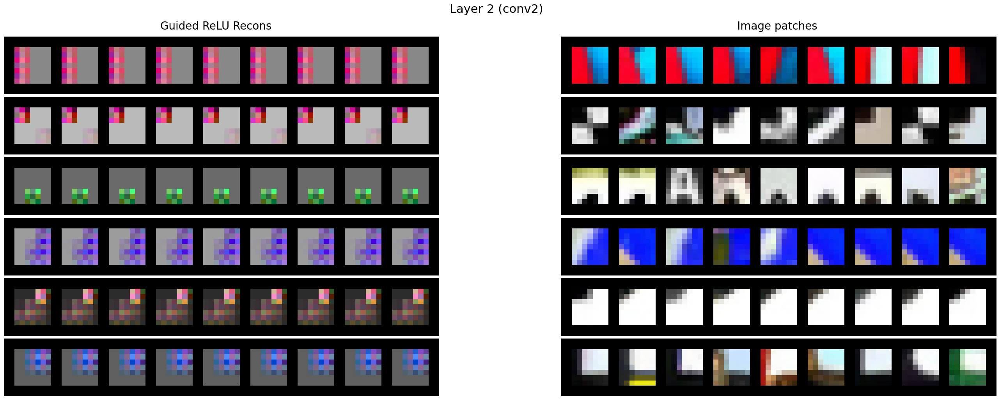

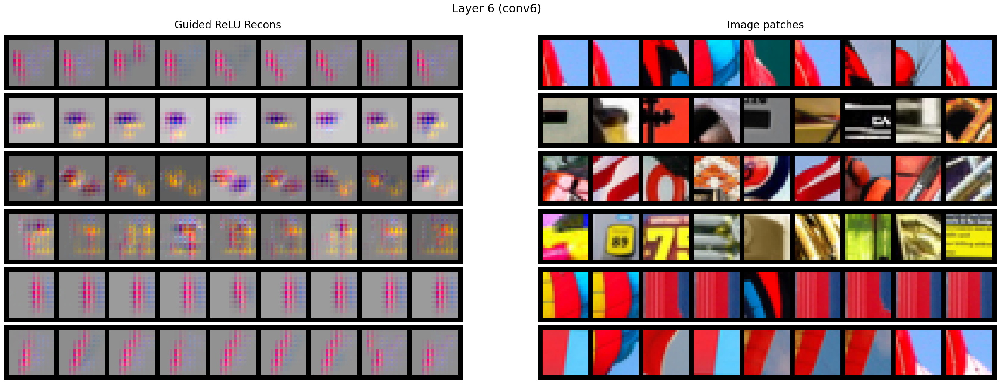

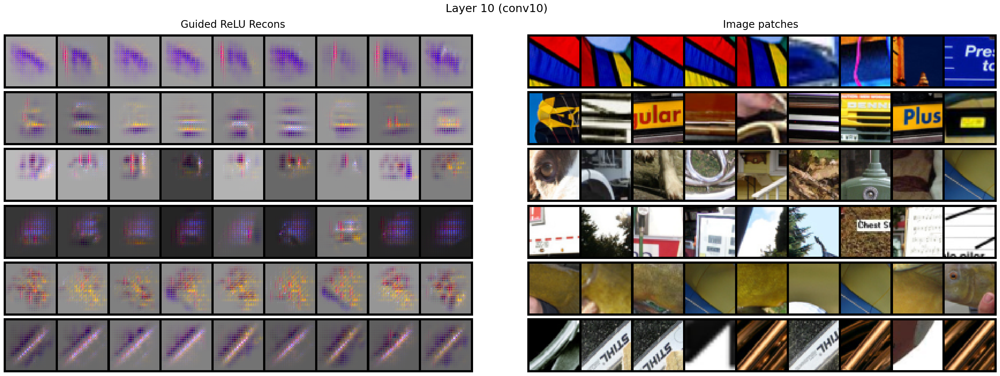

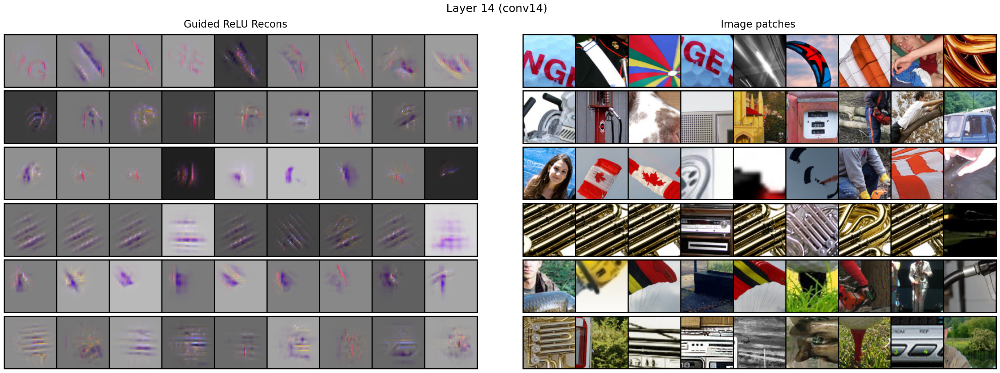

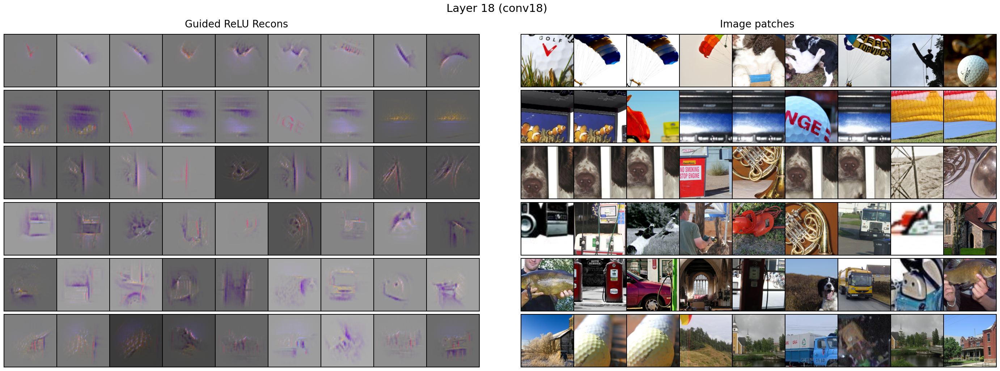

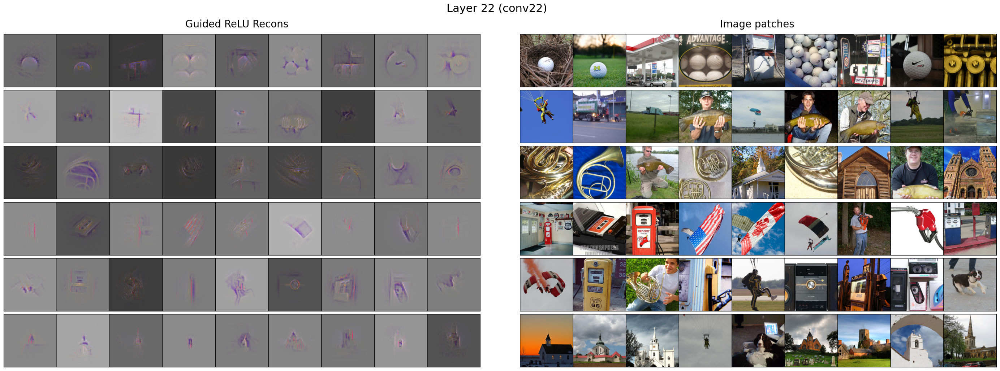

In [10]:
vis = Visualiser(model, device=device, mean=mean, std=std)

panels = vis.figure2_panel(
    test_loader,
    layers=("conv2", "conv6", "conv10", "conv14", "conv18", "conv22", "conv26", "conv27"),
    k_per_map=9,
    n_maps=6,
    seed=0,
)
vis.show_panels(panels)
vis.close()